In [1]:
#Import all the necessary modules
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from sklearn.metrics import mean_absolute_error

import warnings # to ignore warning
from sklearn.preprocessing import RobustScaler, PowerTransformer, LabelEncoder
from sklearn.pipeline import make_pipeline
from keras.wrappers.scikit_learn import KerasRegressor,KerasClassifier
from keras.callbacks import EarlyStopping

from sklearn.preprocessing import PolynomialFeatures, StandardScaler  
from sklearn.metrics import mean_squared_error 
from sklearn.model_selection import KFold, cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import Ridge, LinearRegression, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import partial_dependence, plot_partial_dependence

from xgboost import XGBRegressor 

from tensorflow.keras.utils import to_categorical
from sklearn import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, precision_recall_curve, auc
import matplotlib.pyplot as plt
from tensorflow.keras import optimizers
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow import keras
import time
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from google.colab import drive 
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
p1data = pd.read_csv('/content/drive/MyDrive/Part- 1 - Signal.csv')

In [4]:
%tensorflow_version 2.x

In [ ]:
p1data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Parameter 1      1599 non-null   float64
 1   Parameter 2      1599 non-null   float64
 2   Parameter 3      1599 non-null   float64
 3   Parameter 4      1599 non-null   float64
 4   Parameter 5      1599 non-null   float64
 5   Parameter 6      1599 non-null   float64
 6   Parameter 7      1599 non-null   float64
 7   Parameter 8      1599 non-null   float64
 8   Parameter 9      1599 non-null   float64
 9   Parameter 10     1599 non-null   float64
 10  Parameter 11     1599 non-null   float64
 11  Signal_Strength  1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [ ]:
print("shape is",p1data.shape)
print("size is ",p1data.size)

shape is (1599, 12)
size is  19188


In [ ]:
p1data.head(5)

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
p1data.describe().T

,count,mean,std,min,25%,50%,75%,max
Parameter 1,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
Parameter 2,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
Parameter 3,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
Parameter 4,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
Parameter 5,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
Parameter 6,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
Parameter 7,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
Parameter 8,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
Parameter 9,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
Parameter 10,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [ ]:
p1data.isnull().sum()

Parameter 1        0
Parameter 2        0
Parameter 3        0
Parameter 4        0
Parameter 5        0
Parameter 6        0
Parameter 7        0
Parameter 8        0
Parameter 9        0
Parameter 10       0
Parameter 11       0
Signal_Strength    0
dtype: int64

In [ ]:
for i in p1data.columns:
    print(f"unique {i} values :")
    print(f"{p1data[i].unique()}\n")

unique Parameter 1 values :
[ 7.4  7.8 11.2  7.9  7.3  7.5  6.7  5.6  8.9  8.5  8.1  7.6  6.9  6.3
  7.1  8.3  5.2  5.7  8.8  6.8  4.6  7.7  8.7  6.4  6.6  8.6 10.2  7.
  7.2  9.3  8.   9.7  6.2  5.   4.7  8.4 10.1  9.4  9.   8.2  6.1  5.8
  9.2 11.5  5.4  9.6 12.8 11.  11.6 12.  15.  10.8 11.1 10.  12.5 11.8
 10.9 10.3 11.4  9.9 10.4 13.3 10.6  9.8 13.4 10.7 11.9 12.4 12.2 13.8
  9.1 13.5 10.5 12.6 14.  13.7  9.5 12.7 12.3 15.6  5.3 11.3 13.   6.5
 12.9 14.3 15.5 11.7 13.2 15.9 12.1  5.1  4.9  5.9  6.   5.5]

unique Parameter 2 values :
[0.7   0.88  0.76  0.28  0.66  0.6   0.65  0.58  0.5   0.615 0.61  0.62
 0.56  0.59  0.32  0.22  0.39  0.43  0.49  0.4   0.41  0.71  0.645 0.675
 0.685 0.655 0.605 0.38  1.13  0.45  0.67  0.52  0.935 0.29  0.31  0.51
 0.42  0.63  0.69  0.735 0.725 0.705 0.785 0.75  0.625 0.3   0.55  1.02
 0.775 0.9   0.545 0.575 0.33  0.54  1.07  0.695 1.33  0.745 1.04  0.715
 0.415 0.34  0.68  0.95  0.53  0.64  0.885 0.805 0.73  0.37  0.835 1.09
 0.57  0.44  0.635 0.8

In [ ]:
from numpy import unique
list1=[]
# summarize the number of unique values in each column
for i in range(p1data.shape[1]):
    num = len(unique(p1data.iloc[:, i]))
    percentage = float(num) / p1data.shape[0] * 100
    if percentage < 1:
        list1.append(i)
        print('%d, %d, %.1f%%' % (i, num, percentage))

11, 6, 0.4%


In [ ]:
p1dataX=p1data.copy()

In [ ]:
#Lets remove all columns with zero varaince 
from sklearn.feature_selection import VarianceThreshold
print("shape before removing zero variance ",p1data.shape)
# define the transform
transform = VarianceThreshold()
# transform the input data
p1data_new = transform.fit_transform(p1data)
print("shape after removing zero variance ",p1data_new.shape)

shape before removing zero variance  (1599, 12)
shape after removing zero variance  (1599, 12)


>Threshold=0.00, Features=12
>Threshold=0.10, Features=12
>Threshold=0.20, Features=12
>Threshold=0.30, Features=12
>Threshold=0.40, Features=12
>Threshold=0.50, Features=12
>Threshold=0.60, Features=12
>Threshold=0.70, Features=12
>Threshold=0.80, Features=12
>Threshold=0.90, Features=12


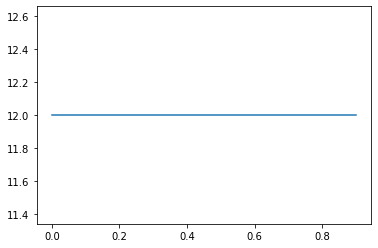

In [ ]:
#we dont have any columns with zero varaince..Lets see by passing threshold values

#thresholds to check
thresholds = np.arange(0.0, 1, 0.1)
# apply transform with each threshold
results = list()
for t in thresholds:
    # define the transform
    tr1 = VarianceThreshold(threshold=t)
    # transform the input data
    p1data_new1 = transform.fit_transform(p1data_new)
    # determine the number of input features
    n_features = p1data_new1.shape[1]
    print('>Threshold=%.2f, Features=%d' % (t, n_features))
    # store the result
    results.append(n_features)
# plot the threshold vs the number of selected features
plt.plot(thresholds, results)
plt.show()

In [ ]:
#check for Duplicate values
dups = p1data.duplicated()
# report if there are any duplicates
print(dups.any())
# list all duplicate rows
print(p1data[dups])

True
      Parameter 1  Parameter 2  ...  Parameter 11  Signal_Strength
4             7.4        0.700  ...           9.4                5
11            7.5        0.500  ...          10.5                5
27            7.9        0.430  ...           9.5                5
40            7.3        0.450  ...          10.5                5
65            7.2        0.725  ...          10.9                5
...           ...          ...  ...           ...              ...
1563          7.2        0.695  ...          10.1                5
1564          7.2        0.695  ...          10.1                5
1567          7.2        0.695  ...          10.1                5
1581          6.2        0.560  ...          11.3                5
1596          6.3        0.510  ...          11.0                6

[240 rows x 12 columns]


In [ ]:
p1data[dups].head(10)

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.9966,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.9978,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.9962,3.41,0.39,10.9,5
76,8.8,0.410,0.64,2.20,0.093,9.0,42.0,0.9986,3.54,0.66,10.5,5
91,8.6,0.490,0.28,1.90,0.110,20.0,136.0,0.9972,2.93,1.95,9.9,6
93,7.7,0.490,0.26,1.90,0.062,9.0,31.0,0.9966,3.39,0.64,9.6,5
102,8.1,0.545,0.18,1.90,0.080,13.0,35.0,0.9972,3.30,0.59,9.0,6
105,8.1,0.575,0.22,2.10,0.077,12.0,65.0,0.9967,3.29,0.51,9.2,5


In [ ]:
p1data.skew()

Parameter 1        0.982751
Parameter 2        0.671593
Parameter 3        0.318337
Parameter 4        4.540655
Parameter 5        5.680347
Parameter 6        1.250567
Parameter 7        1.515531
Parameter 8        0.071288
Parameter 9        0.193683
Parameter 10       2.428672
Parameter 11       0.860829
Signal_Strength    0.217802
dtype: float64

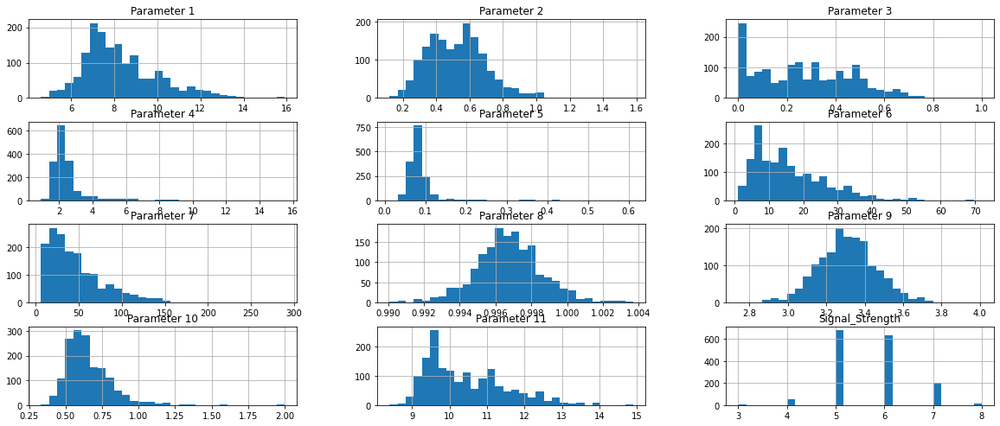

In [ ]:
#columns = list(p1data) 
p1data[columns].hist(stacked=False, bins=30, figsize=(20,30), layout=(14,3)); 

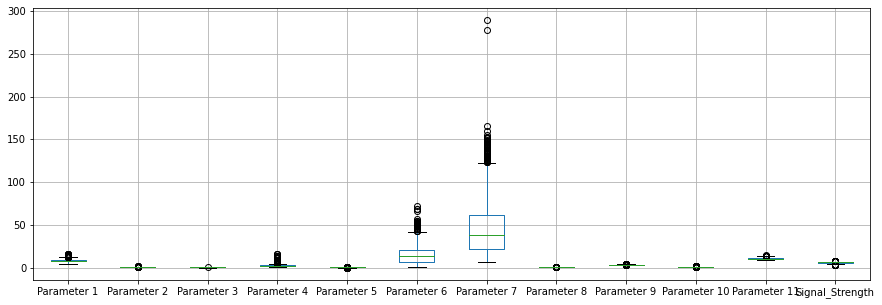

In [ ]:
p1data.boxplot(figsize=(15,5))

In [ ]:
p1data.columns[:-1]

Index(['Parameter 1', 'Parameter 2', 'Parameter 3', 'Parameter 4',
       'Parameter 5', 'Parameter 6', 'Parameter 7', 'Parameter 8',
       'Parameter 9', 'Parameter 10', 'Parameter 11'],
      dtype='object')

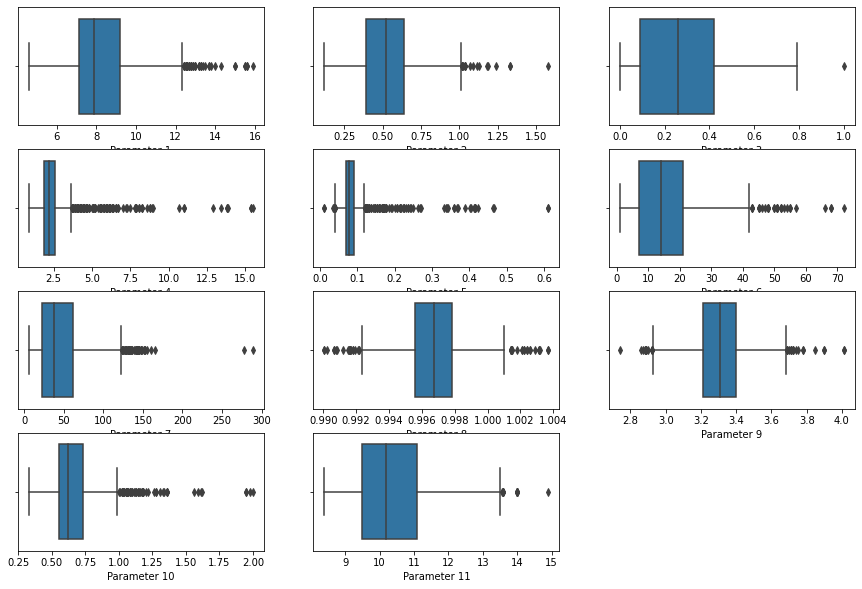

In [ ]:
count=1
list=p1data.columns[:-1]
plt.subplots(figsize=(15, 10))
for col in list:
    plt.subplot(4,3,count)
    sns.boxplot(x=p1data[col])
    count+=1

plt.show()

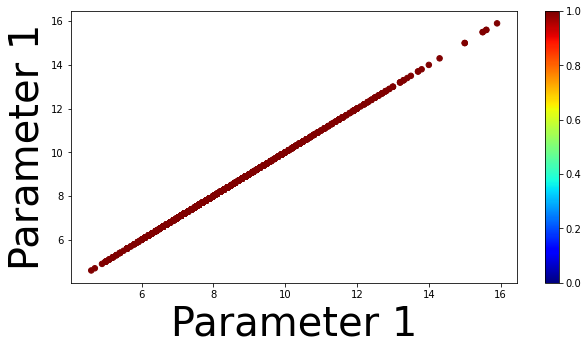

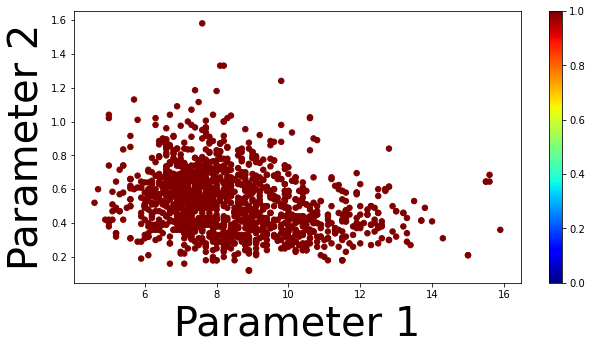

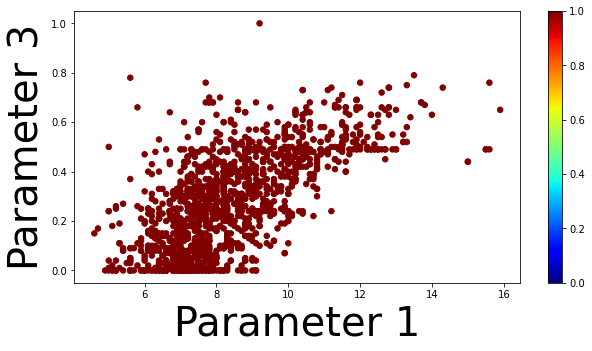

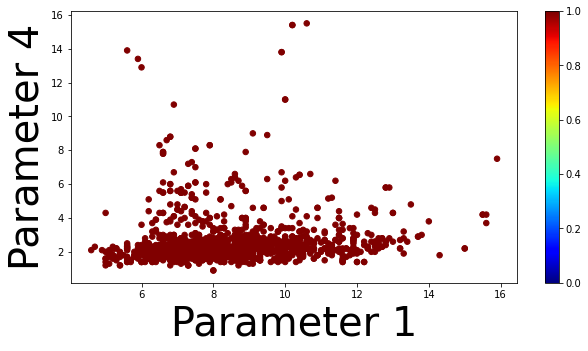

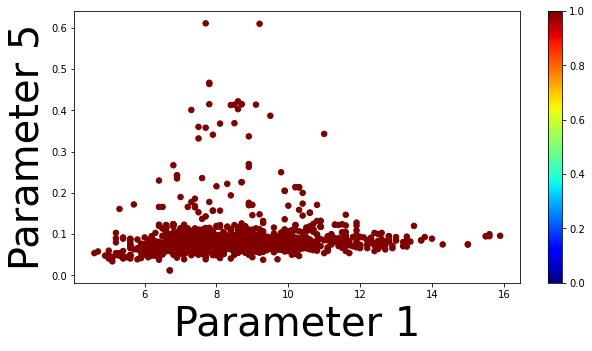

...

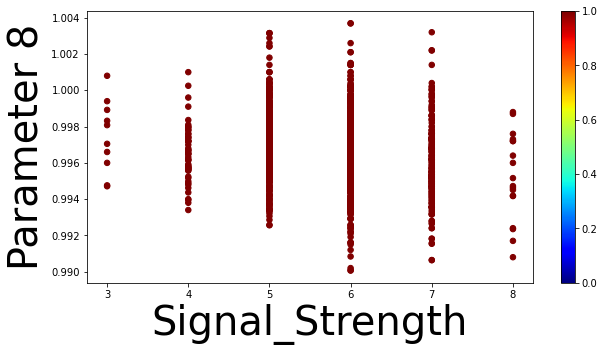

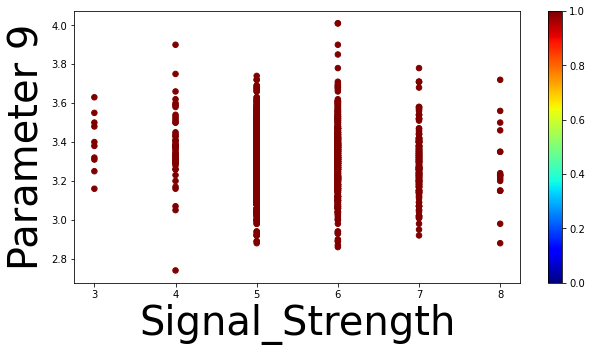

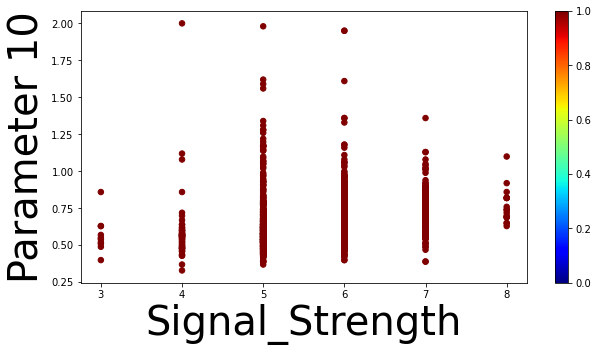

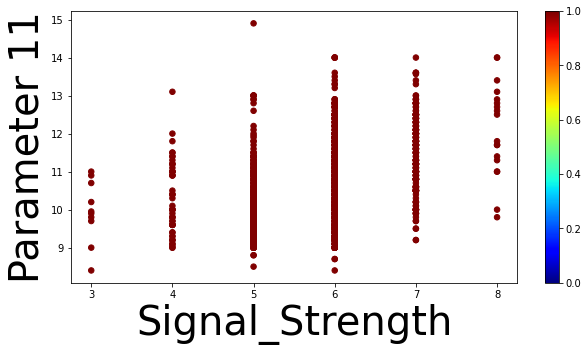

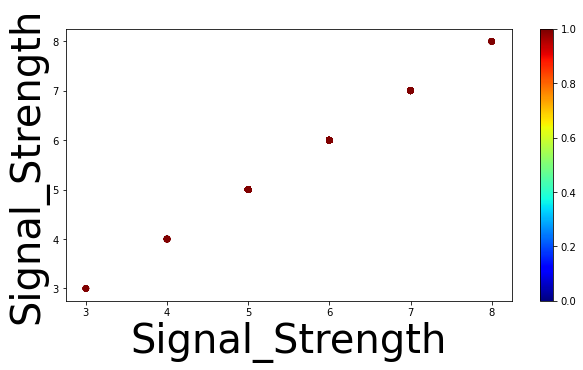

In [ ]:
for column_1st in p1data:
    for coloum_2nd in p1data:
        jet=plt.get_cmap('jet')
        plt.figure(figsize=(5,5))
        plt.scatter(p1data[column_1st], p1data[coloum_2nd], s=30, c=p1data['Signal_Strength'], vmin=0, vmax=1, cmap=jet)
        plt.xlabel(column_1st,fontsize=40)
        plt.ylabel(coloum_2nd,fontsize=40)
        plt.colorbar()
        plt.show()

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 
  
# the independent variables set 
X = p1data[:-1]
# VIF dataframe 
vif_data = pd.DataFrame() 
vif_data["feature"] = X.columns
  
# calculating VIF for each feature 
vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                          for i in range(len(X.columns))] 
  
print(vif_data)

            feature          VIF
0       Parameter 1    74.768931
1       Parameter 2    17.957400
2       Parameter 3     9.211076
3       Parameter 4     4.661696
4       Parameter 5     6.643030
5       Parameter 6     6.457711
6       Parameter 7     6.607377
7       Parameter 8  1528.344226
8       Parameter 9  1077.656345
9      Parameter 10    22.448866
10     Parameter 11   147.531052
11  Signal_Strength    77.674357


From Above we can understand features are correlating highly with each other

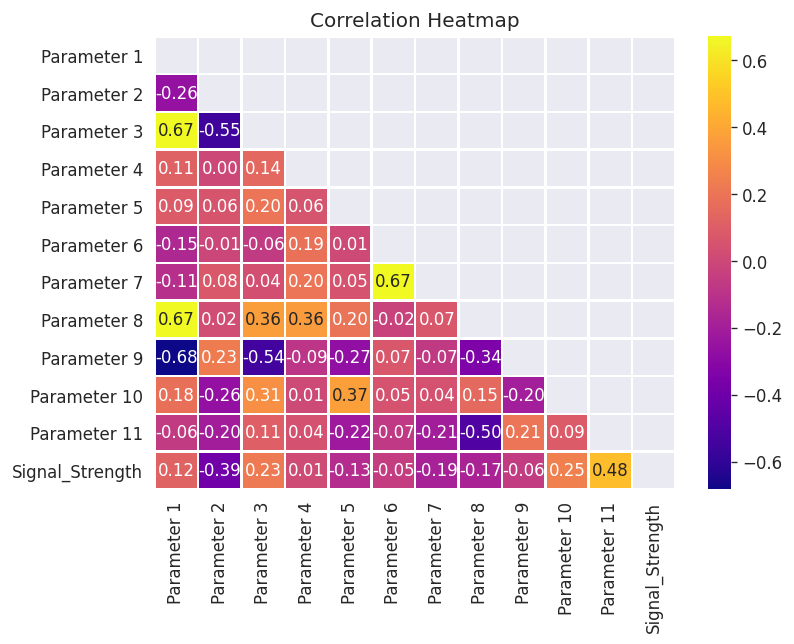

In [ ]:
sns.set_style('darkgrid')
plt.figure(dpi = 120,figsize= (7 ,5))
mask = np.triu(np.ones_like(p1data.corr(),dtype = bool))
sns.heatmap(p1data.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

From Above heatmap we can understand few features are highly correlating. 
Parameter1 is highly correlating with parameter 3 & 8
Parmaeter7 is  hihgly correlating with parmater6

So dropping parameter1 & Parameter7 will help in better model



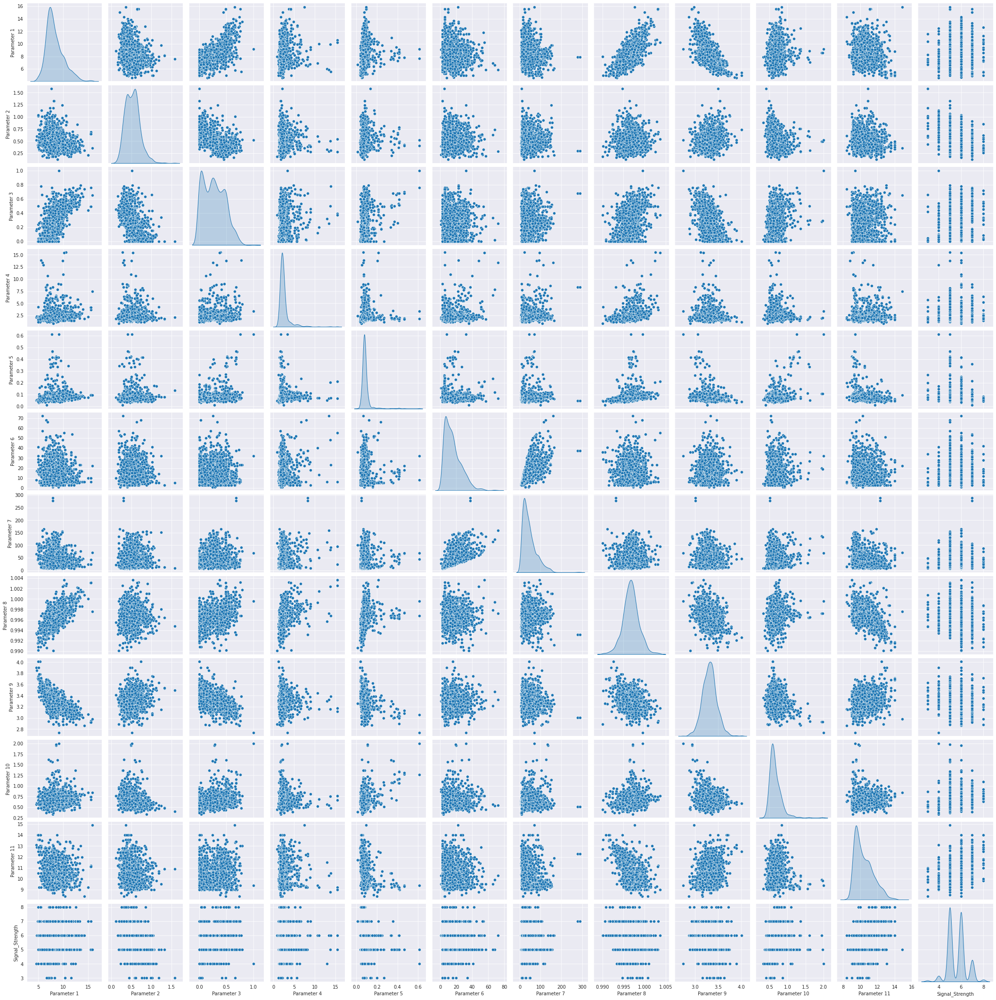

In [ ]:
sns.pairplot(p1data,diag_kind='kde')

#From above pairplots we can understand that no correlation exists among few features and data is not normally distributed

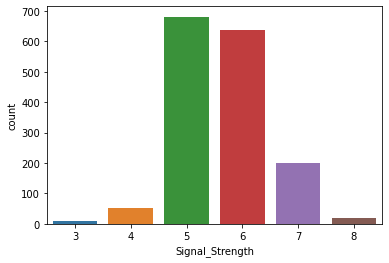

In [ ]:
sns.countplot(x='Signal_Strength',data=p1data)

In [ ]:
p1data_new = p1data.drop(['Parameter 1','Parameter 7'],axis=1)

In [ ]:
p1data_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Parameter 2      1599 non-null   float64
 1   Parameter 3      1599 non-null   float64
 2   Parameter 4      1599 non-null   float64
 3   Parameter 5      1599 non-null   float64
 4   Parameter 6      1599 non-null   float64
 5   Parameter 8      1599 non-null   float64
 6   Parameter 9      1599 non-null   float64
 7   Parameter 10     1599 non-null   float64
 8   Parameter 11     1599 non-null   float64
 9   Signal_Strength  1599 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 125.0 KB


In [ ]:
X=p1data_new.drop(['Signal_Strength'],axis=1)
y=p1data_new['Signal_Strength']

In [ ]:
y.unique()

array([5, 6, 7, 4, 8, 3])

In [ ]:
pre_precessing_pipeline = make_pipeline(RobustScaler(), 
                                        # VarianceThreshold(0.001),
                                       )

X_std = pd.DataFrame(pre_precessing_pipeline.fit_transform(X))

X_std.columns = X.columns
print(X_std.head(5))
print(X_std.shape)

   Parameter 2  Parameter 3  ...  Parameter 10  Parameter 11
0         0.72    -0.787879  ...     -0.333333         -0.50
1         1.44    -0.787879  ...      0.333333         -0.25
2         0.96    -0.666667  ...      0.166667         -0.25
3        -0.96     0.909091  ...     -0.222222         -0.25
4         0.72    -0.787879  ...     -0.333333         -0.50

[5 rows x 9 columns]
(1599, 9)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_std, y, train_size=0.8, test_size=0.2,
                                                                random_state=0)

In [ ]:
print('x_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('x_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

x_train shape:  (1279, 9)
y_train shape:  (1279,)
x_test shape:  (320, 9)
y_test shape:  (320,)


In [ ]:
print("{0:0.2f}% data is in training set".format((len(X_train)/len(p1data.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(X_test)/len(p1data.index)) * 100))

79.99% data is in training set
20.01% data is in test set


Basic Model

In [ ]:
def base_model():
    model = Sequential()
    model.add(Dense(7, input_shape = (9,), activation = 'relu'))
    model.add(Dense(1))
    model.compile(optimizer = "adam", loss = "mean_squared_error")
    return model

In [ ]:
model=base_model()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 7)                 70        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 8         
Total params: 78
Trainable params: 78
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history=model.fit(X_train, y_train, validation_split=0.3,batch_size = 3, epochs = 100, verbose = 1)

Epoch 1/100
299/299 [==============================] - 0s 1ms/step - loss: 0.4253 - val_loss: 0.4261
Epoch 2/100
299/299 [==============================] - 0s 927us/step - loss: 0.4314 - val_loss: 0.4169
Epoch 3/100
299/299 [==============================] - 0s 1ms/step - loss: 0.4238 - val_loss: 0.4307
Epoch 4/100
299/299 [==============================] - 0s 1ms/step - loss: 0.4209 - val_loss: 0.4404
Epoch 5/100
299/299 [==============================] - 0s 1ms/step - loss: 0.4263 - val_loss: 0.4392
Epoch 6/100
299/299 [==============================] - 0s 988us/step - loss: 0.4281 - val_loss: 0.4134
Epoch 7/100
299/299 [==============================] - 0s 1ms/step - loss: 0.4182 - val_loss: 0.4228
Epoch 8/100
299/299 [==============================] - 0s 966us/step - loss: 0.4231 - val_loss: 0.4150
Epoch 9/100
299/299 [==============================] - 0s 988us/step - loss: 0.4231 - val_loss: 0.4052
Epoch 10/100
299/299 [==============================] - 0s 972us/step - loss: 0.424

In [ ]:
predictions=model.predict(X_test)
predictions[0]

array([5.6050644], dtype=float32)

In [ ]:
#Converting 2d to 1d array
predictions=predictions.flatten()
df=pd.DataFrame({'Actual':y_test,'Predicted':predictions})
print(df.head())
print('Mean Squared error:',mean_squared_error(y_test,predictions))

      Actual  Predicted
1109       6   5.605064
1032       5   5.192580
1002       7   6.801064
487        6   4.881364
979        5   5.812078
Mean Squared error: 0.41387378734813113


Basic model with **BatchNorm**

In [ ]:
def batch_model():
    model = Sequential()
    model.add(Dense(7, input_shape = (9,), activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1))
    adam = optimizers.Adam(learning_rate = 0.001)
    model.compile(optimizer = adam, loss = "mean_squared_error")
    return model

In [ ]:
model1=batch_model()
model1.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_21 (Dense)             (None, 7)                 70        
_________________________________________________________________
batch_normalization_2 (Batch (None, 7)                 28        
_________________________________________________________________
dropout_2 (Dropout)          (None, 7)                 0         
_________________________________________________________________
dense_22 (Dense)             (None, 1)                 8         
Total params: 106
Trainable params: 92
Non-trainable params: 14
_________________________________________________________________


In [ ]:
model1.fit(X_train, y_train, validation_split=0.3,batch_size = 3 , epochs = 70, verbose = 1)

Epoch 1/70
299/299 [==============================] - 1s 2ms/step - loss: 28.7829 - val_loss: 22.0181
Epoch 2/70
299/299 [==============================] - 1s 2ms/step - loss: 18.3807 - val_loss: 12.1989
Epoch 3/70
299/299 [==============================] - 1s 2ms/step - loss: 10.4699 - val_loss: 6.1609
Epoch 4/70
299/299 [==============================] - 1s 2ms/step - loss: 6.8243 - val_loss: 3.2592
Epoch 5/70
299/299 [==============================] - 0s 2ms/step - loss: 5.4063 - val_loss: 2.1566
Epoch 6/70
299/299 [==============================] - 0s 2ms/step - loss: 4.5208 - val_loss: 1.5252
Epoch 7/70
299/299 [==============================] - 1s 2ms/step - loss: 4.0086 - val_loss: 1.2872
Epoch 8/70
299/299 [==============================] - 1s 2ms/step - loss: 3.8176 - val_loss: 1.2018
Epoch 9/70
299/299 [==============================] - 1s 2ms/step - loss: 3.3855 - val_loss: 1.0375
Epoch 10/70
299/299 [==============================] - 1s 2ms/step - loss: 3.1336 - val_loss: 0

In [ ]:
predictions=model1.predict(X_test)
predictions[0]

array([5.5325913], dtype=float32)

In [ ]:
#Converting 2d to 1d array
predictions=predictions.flatten()
df=pd.DataFrame({'Actual':y_test,'Predicted':predictions})
print(df.head())
print('Mean Squared error:',mean_squared_error(y_test,predictions))

      Actual  Predicted
1109       6   5.532591
1032       5   5.236751
1002       7   6.247964
487        6   5.323538
979        5   5.770307
Mean Squared error: 0.403756815951651


In [ ]:
#Model with multiple hidden  layers and using he_normal initializer

def mlp_model():
    model = Sequential()
    
    model.add(Dense(9, input_shape = (9, ), kernel_initializer='he_normal',kernel_regularizer= 'l2',activation = 'relu'))     # use he_normal initializer   
    model.add(Dense(20, kernel_initializer='he_normal',kernel_regularizer= 'l2', activation = 'relu'))              # use he_normal initializer
    model.add(Dense(10, kernel_initializer='he_normal',kernel_regularizer= 'l2', activation = 'relu'))                            # use he_normal initializer
    model.add(Dense(1, kernel_initializer='he_normal'))                            # use he_normal initializer
    
    adam = optimizers.Adam(learning_rate = 0.001)
    model.compile(optimizer = adam, loss = 'mean_squared_error')
    
    return model

In [ ]:
model2=mlp_model()
model2.fit(X_train, y_train, validation_split=0.3,batch_size = 3, epochs = 100, verbose = 1)

Epoch 1/100
299/299 [==============================] - 1s 2ms/step - loss: 12.6162 - val_loss: 8.3777
Epoch 2/100
299/299 [==============================] - 1s 2ms/step - loss: 4.2665 - val_loss: 4.5720
Epoch 3/100
299/299 [==============================] - 1s 2ms/step - loss: 2.7403 - val_loss: 3.1293
Epoch 4/100
299/299 [==============================] - 1s 2ms/step - loss: 2.0619 - val_loss: 2.2321
Epoch 5/100
299/299 [==============================] - 1s 2ms/step - loss: 1.6599 - val_loss: 1.8682
Epoch 6/100
299/299 [==============================] - 1s 2ms/step - loss: 1.4477 - val_loss: 1.5518
Epoch 7/100
299/299 [==============================] - 1s 2ms/step - loss: 1.2938 - val_loss: 1.3645
Epoch 8/100
299/299 [==============================] - 1s 2ms/step - loss: 1.1863 - val_loss: 1.2877
Epoch 9/100
299/299 [==============================] - 1s 2ms/step - loss: 1.1295 - val_loss: 1.2021
Epoch 10/100
299/299 [==============================] - 1s 2ms/step - loss: 1.0685 - val_l

In [ ]:
predictions=model2.predict(X_test)
predictions=predictions.flatten()
df=pd.DataFrame({'Actual':y_test,'Predicted':predictions})
df.head()

,Actual,Predicted
1109,6,5.342627
1032,5,5.241835
1002,7,6.717936
487,6,4.859879
979,5,5.723246


In [ ]:
print('Mean Squared error:',mean_squared_error(y_test,predictions))

Mean Squared error: 0.3802346783953595


Testing with **DROPOUT** and **BatchNorm**

In [ ]:
def baseline_model(optimizer='adam'):
    # create model
    model = Sequential()
    model.add(Dense(9, activation='relu', 
                    kernel_regularizer = 'l2', 
                    kernel_initializer = 'he_normal', 
                    input_shape=(9,)))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='relu', 
                    kernel_regularizer = 'l2',
                    kernel_initializer = 'he_normal'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='linear',
                    kernel_regularizer = 'l2', 
                    kernel_initializer='he_normal'))
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
model3=baseline_model()
model3.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_14 (Dense)             (None, 9)                 90        
_________________________________________________________________
batch_normalization (BatchNo (None, 9)                 36        
_________________________________________________________________
dropout (Dropout)            (None, 9)                 0         
_________________________________________________________________
dense_15 (Dense)             (None, 10)                100       
_________________________________________________________________
batch_normalization_1 (Batch (None, 10)                40        
_________________________________________________________________
dropout_1 (Dropout)          (None, 10)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 1)                

In [ ]:
model3.fit(X_train, y_train,validation_split = 0.3,batch_size = 3, epochs = 100, verbose = 1)

Epoch 1/100
299/299 [==============================] - 2s 3ms/step - loss: 29.1130 - val_loss: 24.2469
Epoch 2/100
299/299 [==============================] - 1s 2ms/step - loss: 17.8665 - val_loss: 12.7917
Epoch 3/100
299/299 [==============================] - 1s 2ms/step - loss: 9.3155 - val_loss: 4.8111
Epoch 4/100
299/299 [==============================] - 1s 2ms/step - loss: 6.1256 - val_loss: 2.2791
Epoch 5/100
299/299 [==============================] - 1s 2ms/step - loss: 4.6376 - val_loss: 1.7811
Epoch 6/100
299/299 [==============================] - 1s 2ms/step - loss: 4.2216 - val_loss: 1.6435
Epoch 7/100
299/299 [==============================] - 1s 2ms/step - loss: 3.7855 - val_loss: 1.5231
Epoch 8/100
299/299 [==============================] - 1s 2ms/step - loss: 3.7105 - val_loss: 1.5142
Epoch 9/100
299/299 [==============================] - 1s 2ms/step - loss: 3.4038 - val_loss: 1.3224
Epoch 10/100
299/299 [==============================] - 1s 2ms/step - loss: 3.2377 - va

In [ ]:
predictions=model3.predict(X_test)
predictions=predictions.flatten()
df=pd.DataFrame({'Actual':y_test,'Predicted':predictions})
df.head()

print('Mean Squared error:',mean_squared_error(y_test,predictions))

Mean Squared error: 0.4064213601137183


Tuning with **RandomizedSearchCV**

In [ ]:
estimator = KerasRegressor(build_fn=baseline_model)
# grid search epochs, batch size and optimizer
optimizers = ['rmsprop', 'adam']
epochs = [50, 100, 150]
batches = [5, 10]
#weight_constraint = [1, 2, 3, 4, 5]
param = dict(optimizer=optimizers, 
                 # dropout_rate=dropout_rate, 
                  epochs=epochs, 
                  batch_size=batches) 
                  #weight_constraint=weight_constraint)
                  #init=init)
    
rand = RandomizedSearchCV(estimator=estimator, param_distributions=param,scoring='neg_mean_squared_error')
rand_result = rand.fit(X_train.values, y_train.values)
# summarize results
print("Best: %f using %s" % (rand_result.best_score_, rand_result.best_params_))
means = rand_result.cv_results_['mean_test_score']
stds = rand_result.cv_results_['std_test_score']
params = rand_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
      print("%f (%f) with: %r" % (mean, stdev, param))

For above randomgrid search got best results with below parms

RMSPROP,150 epoches and batch_size =10

Best is 0.43

Note : Lost output due to some issues and not able to retrieve from verisons. Facing issues with GPU colab limits and taking longer times without GPU due to muliple layers

In [ ]:
import h5py
model1.save_weights('base.h5')

In [ ]:
model1.load_weights('base.h5')
# Final evaluation of the model
scores = model1.evaluate(X_test, y_test)
print("Mean Square Error %.2f%%" % (scores))

10/10 [==============================] - 0s 2ms/step - loss: 0.4038
Mean Square Error 0.40%


# **PART B**

---



In [3]:
import h5py
h5f = h5py.File('/content/drive/MyDrive/Part - 4 - Autonomous_Vehicles_SVHN_single_grey1.h5', 'r')
print(list(h5f.keys()))
X_train = h5f['X_train'][:] 
y_train = h5f['y_train'][:] 
X_test = h5f['X_test'][:] 
y_test = h5f['y_test'][:]
X_val = h5f['X_val'][:] 
y_val = h5f['y_val'][:]
h5f.close()


['X_test', 'X_train', 'X_val', 'y_test', 'y_train', 'y_val']


In [4]:
print("X_train shape is", X_train.shape) 
print("y_train shape is", y_train.shape) 
print("X_test shape is", X_test.shape) 
print("y_test shape is", y_test.shape)
print("X_val shape is", X_val.shape) 
print("y_val shape is", y_val.shape)

X_train shape is (42000, 32, 32)
y_train shape is (42000,)
X_test shape is (18000, 32, 32)
y_test shape is (18000,)
X_val shape is (60000, 32, 32)
y_val shape is (60000,)


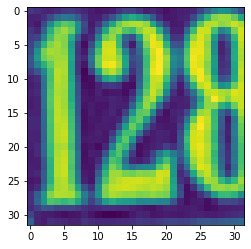

Label:  2


In [ ]:
plt.imshow(X_train[0])    # show first number in the dataset
plt.show()
print('Label: ', y_train[0])

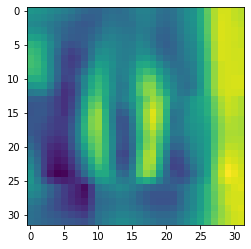

Label:  0


In [ ]:
plt.imshow(X_train[100])    
plt.show()
print('Label: ', y_train[100])

In [5]:
trainX=X_train.copy()
trainy=y_train.copy()
testX=X_test.copy()
testy=y_test.copy()

In [6]:
#Reshape the features from 32×32 into a single dimensional array of 1024
X_train = X_train.reshape((X_train.shape[0], -1))
X_test = X_test.reshape((X_test.shape[0], -1))
X_val = X_val.reshape((X_val.shape[0], -1))

In [7]:
X_train = X_train / 255 
X_test = X_test / 255
X_val = X_val / 255

In [8]:
for i in range(0,10): 
    print("Label: {0} | Value % = {1}".format( i, (y_train[y_train == i].size / y_train.size)*100) )

Label: 0 | Value % = 9.966666666666667
Label: 1 | Value % = 9.933333333333334
Label: 2 | Value % = 9.992857142857142
Label: 3 | Value % = 10.192857142857143
Label: 4 | Value % = 9.971428571428572
Label: 5 | Value % = 10.076190476190476
Label: 6 | Value % = 9.923809523809524
Label: 7 | Value % = 9.980952380952381
Label: 8 | Value % = 9.971428571428572
Label: 9 | Value % = 9.99047619047619


In [9]:
# converting y data into categorical (one-hot encoding)
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
y_val = to_categorical(y_val)

In [10]:
print("X_train shape is", X_train.shape) 
print("y_train shape is", y_train.shape) 
print("X_test shape is", X_test.shape) 
print("y_test shape is", y_test.shape)
print("X_val shape is", X_val.shape) 
print("y_val shape is", y_val.shape)

X_train shape is (42000, 1024)
y_train shape is (42000, 10)
X_test shape is (18000, 1024)
y_test shape is (18000, 10)
X_val shape is (60000, 1024)
y_val shape is (60000, 10)


In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense
from tensorflow.keras import optimizers

In [19]:
def basic_nn() :
    model = Sequential()
    model.add(Dense(512, input_shape = (1024, ),activation = 'relu'))
    model.add(Dense(256,activation = 'relu'))
    model.add(Dense(128,activation = 'relu'))
    model.add(Dense(64,activation = 'relu'))
    model.add(Dense(10,activation = 'softmax'))

    sgd = optimizers.SGD(learning_rate = 0.01)
    #adam = optimizers.Adam(learning_rate = 0.01)
    model.compile(optimizer = sgd, loss = 'categorical_crossentropy', metrics = ['accuracy'])

    return model

In [20]:
basic_model = basic_nn()
basic_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 512)               524800    
_________________________________________________________________
dense_11 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_12 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_13 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_14 (Dense)             (None, 10)                650       
Total params: 697,930
Trainable params: 697,930
Non-trainable params: 0
_________________________________________________________________


In [21]:
history = basic_model.fit(X_train, y_train, validation_data = (X_val,y_val),batch_size = 300, epochs = 50, verbose = 1)

Epoch 1/50
140/140 [==============================] - 2s 10ms/step - loss: 2.2999 - accuracy: 0.1218 - val_loss: 2.2886 - val_accuracy: 0.1515
Epoch 2/50
140/140 [==============================] - 1s 9ms/step - loss: 2.2831 - accuracy: 0.1663 - val_loss: 2.2751 - val_accuracy: 0.2024
Epoch 3/50
140/140 [==============================] - 1s 9ms/step - loss: 2.2687 - accuracy: 0.2023 - val_loss: 2.2601 - val_accuracy: 0.2219
Epoch 4/50
140/140 [==============================] - 1s 8ms/step - loss: 2.2513 - accuracy: 0.2363 - val_loss: 2.2406 - val_accuracy: 0.2625
Epoch 5/50
140/140 [==============================] - 1s 9ms/step - loss: 2.2287 - accuracy: 0.2691 - val_loss: 2.2150 - val_accuracy: 0.2799
Epoch 6/50
140/140 [==============================] - 1s 8ms/step - loss: 2.1972 - accuracy: 0.2975 - val_loss: 2.1759 - val_accuracy: 0.3105
Epoch 7/50
140/140 [==============================] - 1s 9ms/step - loss: 2.1520 - accuracy: 0.3206 - val_loss: 2.1264 - val_accuracy: 0.3349
Epoch

In [22]:
results = basic_model.evaluate(X_test, y_test)

563/563 [==============================] - 2s 3ms/step - loss: 0.8821 - accuracy: 0.7344


In [24]:
print('accuracy Results: ', results)

accuracy Results:  [0.8820891380310059, 0.7343888878822327]


WIth SGD and Learning_rate of 0.01 we got accuracy of 73.4%

In [11]:
def basic_adam_nn() :
    model = Sequential()
    model.add(Dense(512, input_shape = (1024, ),activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(256,activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(128,activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(64,activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(10,activation = 'softmax'))

    adam = optimizers.Adam(learning_rate = 0.01)
    model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])

    return model

In [12]:
adam_model = basic_adam_nn()

In [13]:
history = adam_model.fit(X_train, y_train,validation_data = (X_val,y_val), batch_size = 300, epochs = 50, verbose = 1)

Epoch 1/50
140/140 [==============================] - 6s 32ms/step - loss: 1.7493 - accuracy: 0.3714 - val_loss: 4.1867 - val_accuracy: 0.2683
Epoch 2/50
140/140 [==============================] - 4s 31ms/step - loss: 1.1515 - accuracy: 0.6264 - val_loss: 2.6927 - val_accuracy: 0.3277
Epoch 3/50
140/140 [==============================] - 4s 31ms/step - loss: 0.9519 - accuracy: 0.6989 - val_loss: 3.7121 - val_accuracy: 0.2334
Epoch 4/50
140/140 [==============================] - 4s 32ms/step - loss: 0.8336 - accuracy: 0.7360 - val_loss: 1.8052 - val_accuracy: 0.4720
Epoch 5/50
140/140 [==============================] - 4s 32ms/step - loss: 0.7672 - accuracy: 0.7581 - val_loss: 2.3958 - val_accuracy: 0.4392
Epoch 6/50
140/140 [==============================] - 4s 32ms/step - loss: 0.7130 - accuracy: 0.7742 - val_loss: 1.1921 - val_accuracy: 0.6288
Epoch 7/50
140/140 [==============================] - 4s 31ms/step - loss: 0.6613 - accuracy: 0.7900 - val_loss: 1.0490 - val_accuracy: 0.6679

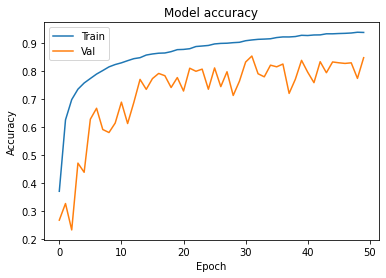

In [14]:

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

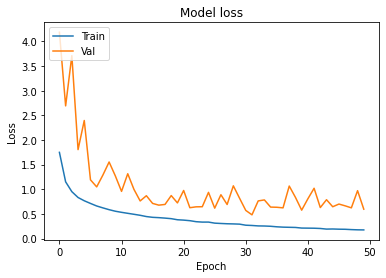

In [15]:
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

Adding BatchNormalization with Adam improved accuracy results and loss is decreased

In [16]:
Test_Built_model = adam_model.fit(X_test,y_test,epochs = 10,batch_size = 300,verbose = 1)

Epoch 1/10
60/60 [==============================] - 1s 21ms/step - loss: 0.6711 - accuracy: 0.8197
Epoch 2/10
60/60 [==============================] - 1s 21ms/step - loss: 0.4368 - accuracy: 0.8651
Epoch 3/10
60/60 [==============================] - 1s 21ms/step - loss: 0.3866 - accuracy: 0.8796
Epoch 4/10
60/60 [==============================] - 1s 20ms/step - loss: 0.3511 - accuracy: 0.8892
Epoch 5/10
60/60 [==============================] - 1s 20ms/step - loss: 0.3157 - accuracy: 0.8988
Epoch 6/10
60/60 [==============================] - 1s 21ms/step - loss: 0.2959 - accuracy: 0.9049
Epoch 7/10
60/60 [==============================] - 1s 21ms/step - loss: 0.2705 - accuracy: 0.9118
Epoch 8/10
60/60 [==============================] - 1s 21ms/step - loss: 0.2510 - accuracy: 0.9173
Epoch 9/10
60/60 [==============================] - 1s 20ms/step - loss: 0.2376 - accuracy: 0.9224
Epoch 10/10
60/60 [==============================] - 1s 20ms/step - loss: 0.2351 - accuracy: 0.9237


In [18]:
results = adam_model.evaluate(X_test, y_test)
print("Test accuracy" , results[1])

563/563 [==============================] - 2s 3ms/step - loss: 0.6655 - accuracy: 0.7918
Test accuracy 0.7918333411216736


In [27]:
predictions=adam_model.predict_classes(X_test)
#predictions=predictions.flatten()
#df=pd.DataFrame({'Actual':testy,'Predicted':predictions})
#df.head()
print(testy[:10],predictions[0:10])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


[1 7 2 9 0 9 1 8 4 4] [1 7 2 9 0 9 1 8 1 4]


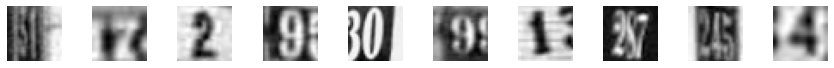

label for each of the above image: [1 7 2 9 0 9 1 8 4 4]


In [28]:
plt.figure(figsize=(15, 1))
for i in range(10):
    plt.subplot(1, 10, i+1)
    plt.imshow(X_test[i].reshape(32,32), cmap="gray")
    plt.axis('off')
plt.show()
print('label for each of the above image: %s' % (testy[:10]))

In [29]:
#model with Dropouts
def batchdrop__nn() :
    model = Sequential()
    model.add(Dense(256, input_shape = (1024, ),activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(128,activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32,activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(10,activation = 'softmax'))

    adam = optimizers.Adam(learning_rate = 0.01)
    model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])

    return model

In [30]:
batch_model = batchdrop__nn()
batch_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 256)               262400    
_________________________________________________________________
batch_normalization_4 (Batch (None, 256)               1024      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               32896     
_________________________________________________________________
batch_normalization_5 (Batch (None, 128)               512       
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 32)               

In [31]:
history = batch_model.fit(X_train, y_train,validation_data = (X_val,y_val), batch_size = 300, epochs = 50, verbose = 1)

Epoch 1/50
140/140 [==============================] - 4s 19ms/step - loss: 2.3935 - accuracy: 0.1074 - val_loss: 2.3044 - val_accuracy: 0.1153
Epoch 2/50
140/140 [==============================] - 3s 18ms/step - loss: 2.1843 - accuracy: 0.1543 - val_loss: 2.0328 - val_accuracy: 0.2008
Epoch 3/50
140/140 [==============================] - 2s 18ms/step - loss: 2.0202 - accuracy: 0.2187 - val_loss: 2.0309 - val_accuracy: 0.2468
Epoch 4/50
140/140 [==============================] - 3s 18ms/step - loss: 1.8513 - accuracy: 0.3130 - val_loss: 1.9027 - val_accuracy: 0.3068
Epoch 5/50
140/140 [==============================] - 2s 17ms/step - loss: 1.7822 - accuracy: 0.3535 - val_loss: 1.6288 - val_accuracy: 0.4471
Epoch 6/50
140/140 [==============================] - 3s 18ms/step - loss: 1.7105 - accuracy: 0.3918 - val_loss: 1.6515 - val_accuracy: 0.4205
Epoch 7/50
140/140 [==============================] - 2s 17ms/step - loss: 1.6556 - accuracy: 0.4106 - val_loss: 1.5249 - val_accuracy: 0.4619

In [32]:
results = batch_model.evaluate(X_test, y_test)
print('Test accuracy: ', results[1])

563/563 [==============================] - 1s 2ms/step - loss: 1.2466 - accuracy: 0.5653
Test accuracy:  0.5653333067893982


Not much imporvement with Dropout...Lets test with decreasing layers

In [33]:
#model with Dropouts
def batchdrop1__nn() :
    model = Sequential()
    model.add(Dense(128,activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(32,activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(10,activation = 'softmax'))

    adam = optimizers.Adam(learning_rate = 0.01)
    model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])

    return model

In [34]:
batch1_model = batchdrop1__nn()
history = batch1_model.fit(X_train, y_train,validation_data = (X_val,y_val), batch_size = 300, epochs = 50, verbose = 1)

Epoch 1/50
140/140 [==============================] - 2s 12ms/step - loss: 2.3566 - accuracy: 0.1297 - val_loss: 2.1736 - val_accuracy: 0.1533
Epoch 2/50
140/140 [==============================] - 2s 11ms/step - loss: 2.0505 - accuracy: 0.2321 - val_loss: 1.8469 - val_accuracy: 0.3122
Epoch 3/50
140/140 [==============================] - 2s 11ms/step - loss: 1.9131 - accuracy: 0.2853 - val_loss: 1.7777 - val_accuracy: 0.3536
Epoch 4/50
140/140 [==============================] - 2s 11ms/step - loss: 1.8622 - accuracy: 0.3160 - val_loss: 1.7006 - val_accuracy: 0.4143
Epoch 5/50
140/140 [==============================] - 2s 11ms/step - loss: 1.8091 - accuracy: 0.3409 - val_loss: 1.7760 - val_accuracy: 0.3146
Epoch 6/50
140/140 [==============================] - 2s 11ms/step - loss: 1.7710 - accuracy: 0.3572 - val_loss: 1.5424 - val_accuracy: 0.4497
Epoch 7/50
140/140 [==============================] - 2s 11ms/step - loss: 1.7259 - accuracy: 0.3778 - val_loss: 1.5505 - val_accuracy: 0.4173

Adding Dropouts did nt improved anything. Val_accuracy is more compared to Training accuracy.

In [39]:
#using with he_normal initializer
def init_nn() :
    model = Sequential()
    model.add(Dense(512, input_shape = (1024, ),activation = 'relu', 
                    kernel_initializer = 'he_normal'))
    model.add(BatchNormalization())
    model.add(Dense(256,activation = 'relu',kernel_initializer = 'he_normal'))
    model.add(BatchNormalization())
    model.add(Dense(128,activation = 'relu',kernel_initializer = 'he_normal'))
    model.add(BatchNormalization())
    model.add(Dense(64,activation = 'relu',kernel_initializer = 'he_normal'))
    model.add(BatchNormalization())
    model.add(Dense(10,activation = 'softmax'))

    adam = optimizers.Adam(learning_rate = 0.01)
    model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])

    return model

In [40]:
init_model = init_nn()
init_model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17 (Dense)             (None, 512)               524800    
_________________________________________________________________
batch_normalization_13 (Batc (None, 512)               2048      
_________________________________________________________________
dense_18 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_14 (Batc (None, 256)               1024      
_________________________________________________________________
dense_19 (Dense)             (None, 128)               32896     
_________________________________________________________________
batch_normalization_15 (Batc (None, 128)               512       
_________________________________________________________________
dense_20 (Dense)             (None, 64)               

In [41]:
history = init_model.fit(X_train, y_train,validation_data = (X_val,y_val), batch_size = 300, epochs = 50, verbose = 1)

Epoch 1/50
140/140 [==============================] - 5s 33ms/step - loss: 1.6844 - accuracy: 0.4070 - val_loss: 2.2809 - val_accuracy: 0.3784
Epoch 2/50
140/140 [==============================] - 4s 32ms/step - loss: 1.0851 - accuracy: 0.6549 - val_loss: 2.0240 - val_accuracy: 0.4276
Epoch 3/50
140/140 [==============================] - 4s 32ms/step - loss: 0.9210 - accuracy: 0.7092 - val_loss: 1.7324 - val_accuracy: 0.4917
Epoch 4/50
140/140 [==============================] - 4s 32ms/step - loss: 0.8310 - accuracy: 0.7371 - val_loss: 3.2787 - val_accuracy: 0.2437
Epoch 5/50
140/140 [==============================] - 4s 31ms/step - loss: 0.7605 - accuracy: 0.7594 - val_loss: 1.3715 - val_accuracy: 0.5916
Epoch 6/50
140/140 [==============================] - 4s 31ms/step - loss: 0.6932 - accuracy: 0.7791 - val_loss: 1.2913 - val_accuracy: 0.5890
Epoch 7/50
140/140 [==============================] - 4s 32ms/step - loss: 0.6561 - accuracy: 0.7908 - val_loss: 1.1401 - val_accuracy: 0.6502

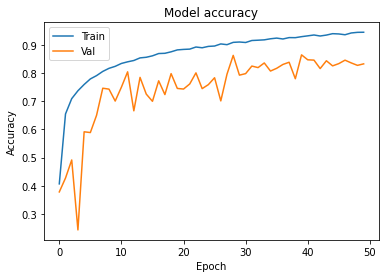

In [42]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

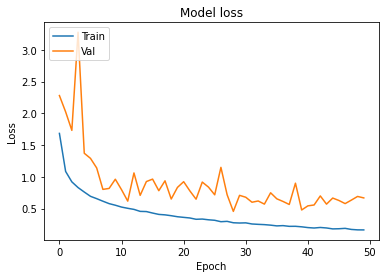

In [43]:
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

In [44]:
Test_init_model = init_model.fit(X_test,y_test,epochs = 10,batch_size = 300,verbose = 1)

Epoch 1/10
60/60 [==============================] - 1s 20ms/step - loss: 0.6774 - accuracy: 0.8182
Epoch 2/10
60/60 [==============================] - 1s 20ms/step - loss: 0.4455 - accuracy: 0.8612
Epoch 3/10
60/60 [==============================] - 1s 21ms/step - loss: 0.3777 - accuracy: 0.8844
Epoch 4/10
60/60 [==============================] - 1s 21ms/step - loss: 0.3461 - accuracy: 0.8907
Epoch 5/10
60/60 [==============================] - 1s 20ms/step - loss: 0.3191 - accuracy: 0.8979
Epoch 6/10
60/60 [==============================] - 1s 21ms/step - loss: 0.2941 - accuracy: 0.9043
Epoch 7/10
60/60 [==============================] - 1s 20ms/step - loss: 0.2738 - accuracy: 0.9094
Epoch 8/10
60/60 [==============================] - 1s 20ms/step - loss: 0.2388 - accuracy: 0.9209
Epoch 9/10
60/60 [==============================] - 1s 20ms/step - loss: 0.2369 - accuracy: 0.9207
Epoch 10/10
60/60 [==============================] - 1s 21ms/step - loss: 0.2250 - accuracy: 0.9238


In [46]:
results = init_model.evaluate(X_test, y_test)
print("Test accuracy" , results[1])

563/563 [==============================] - 2s 3ms/step - loss: 0.3625 - accuracy: 0.8866
Test accuracy 0.886555552482605


Accuracy has been increased with initializer and loss has been decreased to 0.36

In [48]:
predictions=init_model.predict_classes(X_test)
print(testy[:10],predictions[:10])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


[1 7 2 9 0 9 1 8 4 4] [6 7 2 9 0 9 1 8 1 4]


Model performance has been increased with initializer addition


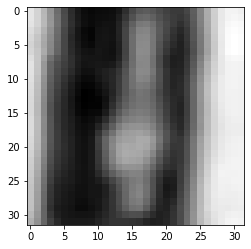

In [51]:
#Showing the image
plt.imshow(X_test[115].reshape(32,32),cmap='gray')

In [52]:
#Predicting the digits
init_model.predict_classes(X_test)[115]

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


4

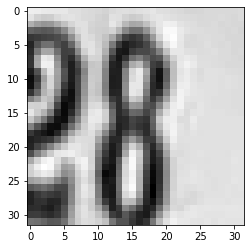

In [54]:
#Showing the image
plt.imshow(X_test[55].reshape(32,32),cmap='gray')

In [55]:
#Predicting the digits
init_model.predict_classes(X_test)[55]

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


8

Tuning model with hyperparmeters

In [ ]:
def randgrid_model(learning_rate,dropout_rate,activation_function,init):
    model = Sequential()
    model.add(Dense(512, input_shape = (1024, ),activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(256,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(256,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(256,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(256,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(256,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(10,activation = 'softmax'))

    adam = optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
    
    return model

estimator = KerasClassifier(build_fn=randgrid_model,verbose=1)
# Define the grid search parameters

batch_size = [100,200,300]
epochs = [150,200,250]
learning_rate = [0.001,0.01]
dropout_rate = [0.5,0.1,0.2,0.3,0.4]
activation_function = ['relu','sigmoid','softmax']
init = ['he_normal','uniform']

# Make a dictionary of the grid search parameters

param_grids = dict(batch_size = batch_size,epochs = epochs,learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function,init = init)

rand = RandomizedSearchCV(estimator=estimator, param_distributions=param_grids)
rand_result = rand.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (rand_result.best_score_, rand_result.best_params_))
means = rand_result.cv_results_['mean_test_score']
stds = rand_result.cv_results_['std_test_score']
params = rand_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


Streaming output truncated to the last 5000 lines.
336/336 [==============================] - 7s 20ms/step - loss: 1.6156 - accuracy: 0.4208
Epoch 120/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6130 - accuracy: 0.4243
Epoch 121/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6261 - accuracy: 0.4215
Epoch 122/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6167 - accuracy: 0.4252
Epoch 123/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6220 - accuracy: 0.4246
Epoch 124/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6068 - accuracy: 0.4292
Epoch 125/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6128 - accuracy: 0.4220
Epoch 126/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6138 - accuracy: 0.4290
Epoch 127/200
336/336 [==============================] - 7s 20ms/step - loss: 1.6155 - accuracy: 0.4253
Epoch 128/200
336/336 [====

In [ ]:
def grid_model(learning_rate,dropout_rate,activation_function,init):
    model = Sequential()
    model.add(Dense(512, input_shape = (1024, ),activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(256,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(128,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(64,activation = activation_function,kernel_initializer = init))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))
    model.add(Dense(10,activation = 'softmax'))

    adam = optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
    
    return model

# Create the model

model = KerasClassifier(build_fn = final_model,verbose = 0)

# Define the grid search parameters

batch_size = [100,200,300]
epochs = [100,200,300]
learning_rate = [0.001,0.01]
dropout_rate = [0.1,0.2,0.3,0.4,0.5]
activation_function = ['softmax','relu']
init = ['uniform','he_normal']

# Make a dictionary of the grid search parameters

param_grids = dict(batch_size = batch_size,epochs = epochs,learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function,init = init)

# Build and fit the GridSearchCV

#grid = GridSearchCV(estimator = model,param_grid = param_grids,cv = KFold(),verbose = 10)
grid = GridSearchCV(estimator = model,param_grid = param_grids,verbose = 10)
grid_result = grid.fit(X_train,y_train)

# Summarize the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Not able to run hyperparameter tuning due to GPU time limit issues on Colab. 